In [1]:
!pip install czifile

     ---------------------------------------- 0.0/24.7 MB ? eta -:--:--
      --------------------------------------- 0.5/24.7 MB 10.5 MB/s eta 0:00:03
     -- ------------------------------------- 1.4/24.7 MB 17.3 MB/s eta 0:00:02
     --- ------------------------------------ 2.1/24.7 MB 19.1 MB/s eta 0:00:02
     ------ --------------------------------- 3.8/24.7 MB 20.2 MB/s eta 0:00:02
     -------- ------------------------------- 5.2/24.7 MB 22.4 MB/s eta 0:00:01
     --------- ------------------------------ 6.1/24.7 MB 21.8 MB/s eta 0:00:01
     ------------- -------------------------- 8.3/24.7 MB 25.2 MB/s eta 0:00:01
     --------------- ----------------------- 10.1/24.7 MB 26.9 MB/s eta 0:00:01
     ---------------- ---------------------- 10.5/24.7 MB 28.4 MB/s eta 0:00:01
     ---------------- ---------------------- 10.5/24.7 MB 28.4 MB/s eta 0:00:01
     ------------------- ------------------- 12.5/24.7 MB 27.3 MB/s eta 0:00:01
     ------------------- ------------------- 12.

In [24]:
# Import functions from python library

import czifile as cz
from czifile import czi2tif

In [68]:
# Convert czi file to tiff file

cz.czi2tif('galactoseB.czi' , 'galactoseB.tiff')
cz.czi2tif('galactoseC.czi' , 'galactoseC.tiff')
cz.czi2tif('glucoseA.czi' , 'glucoseA.tiff')
cz.czi2tif('glucoseB.czi' , 'glucoseB.tiff')
cz.czi2tif('glucoseC.czi' , 'glucoseC.tiff')


Opening CZI file... 0.002548 s
Image
  axes:  TYX
  shape: (15, 512, 512)
  dtype: uint16
  size:  7.50 MiB
Creating empty TIF file... 0.057088 s
Copying image from CZI to TIF file... 0.020148 s

Opening CZI file... 0.009048 s
Image
  axes:  TYX
  shape: (15, 512, 512)
  dtype: uint16
  size:  7.50 MiB
Creating empty TIF file... 0.066921 s
Copying image from CZI to TIF file... 0.026302 s

Opening CZI file... 0.011228 s
Image
  axes:  TYX
  shape: (16, 512, 512)
  dtype: uint16
  size:  8.00 MiB
Creating empty TIF file... 0.062292 s
Copying image from CZI to TIF file... 0.033575 s

Opening CZI file... 0.008285 s
Image
  axes:  TYX
  shape: (15, 512, 512)
  dtype: uint16
  size:  7.50 MiB
Creating empty TIF file... 0.054139 s
Copying image from CZI to TIF file... 0.041605 s

Opening CZI file... 0.010329 s
Image
  axes:  TYX
  shape: (15, 512, 512)
  dtype: uint16
  size:  7.50 MiB
Creating empty TIF file... 0.060485 s
Copying image from CZI to TIF file... 0.032493 s


In [4]:
# Import functions from python library

import czifile as cz
from czifile import czi2tif
import tifffile as tf
import numpy as np
import matplotlib.pyplot as plt
import statistics as stats
from scipy import ndimage as ndi
from skimage.util import random_noise
from skimage import feature, io

In [315]:
# Create list with all tiff files

tiff_files = ['galactoseA.tiff', 'galactoseB.tiff','galactoseC.tiff','glucoseA.tiff','glucoseB.tiff','glucoseC.tiff']

time= 0 s


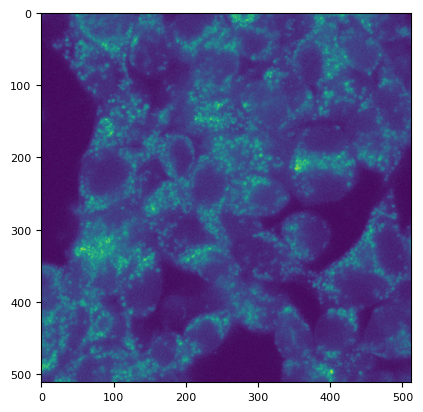

time= 30 s


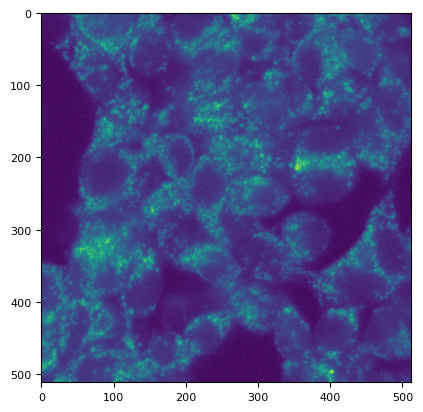

time= 60 s


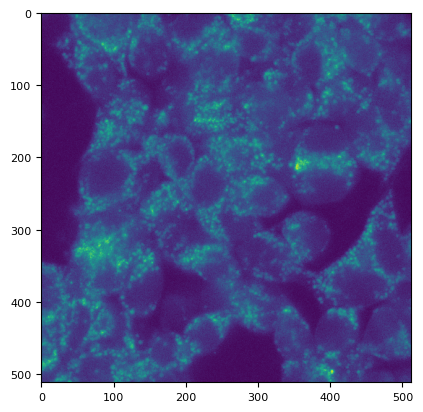

time= 90 s


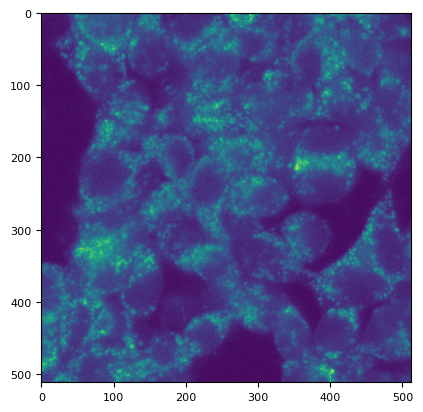

time= 120 s


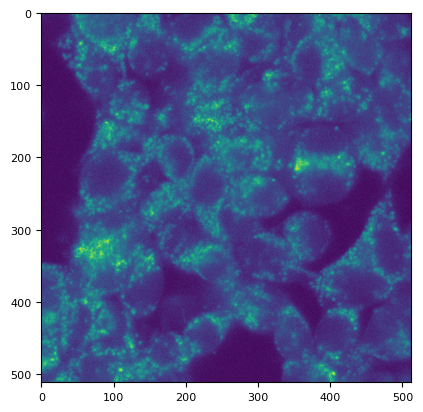

time= 150 s


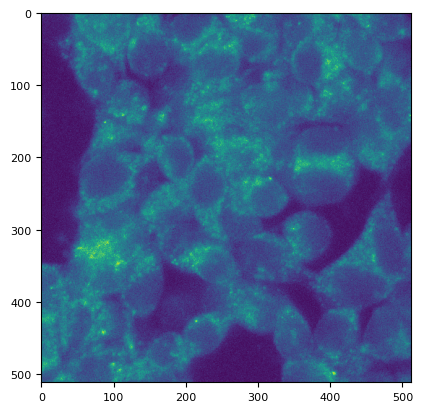

time= 180 s


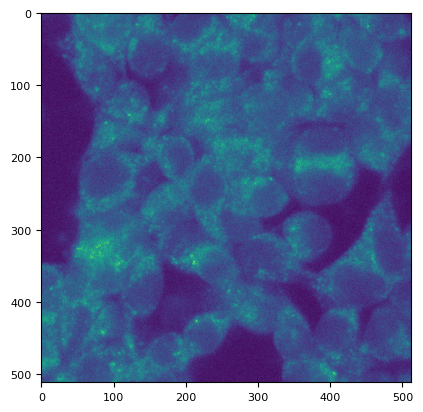

time= 210 s


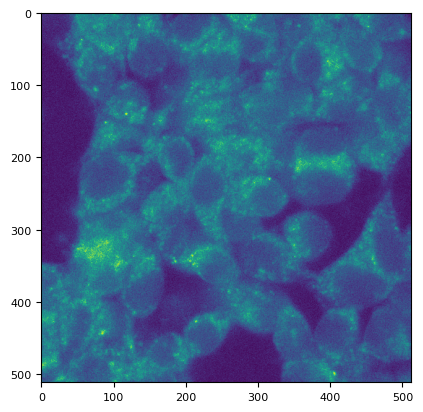

time= 240 s


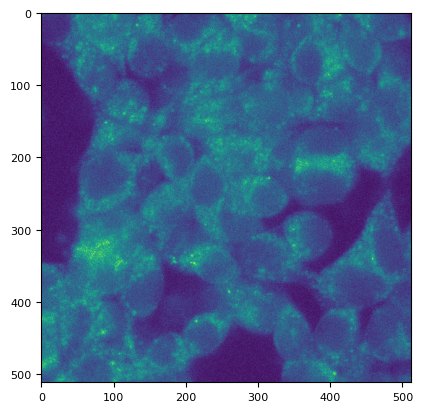

time= 270 s


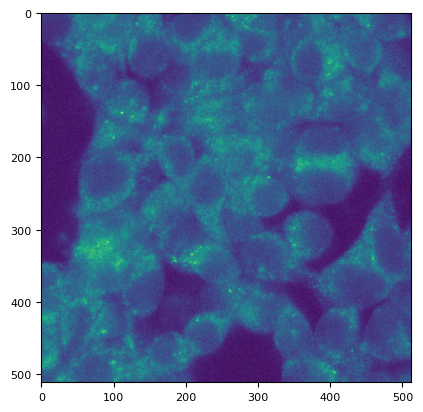

time= 300 s


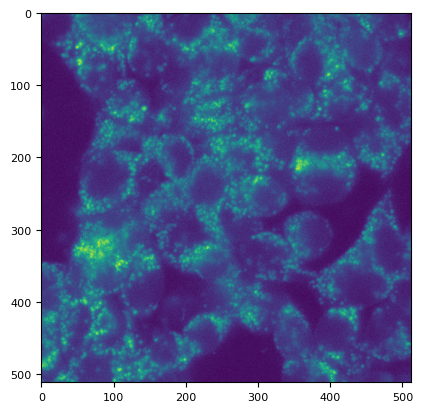

time= 330 s


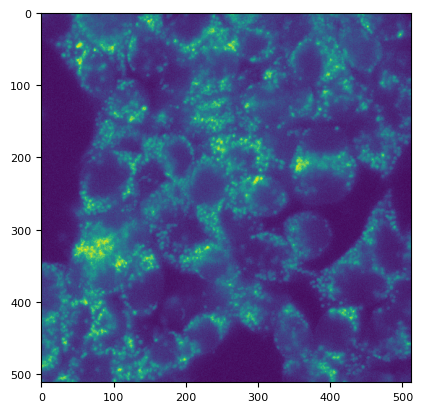

time= 360 s


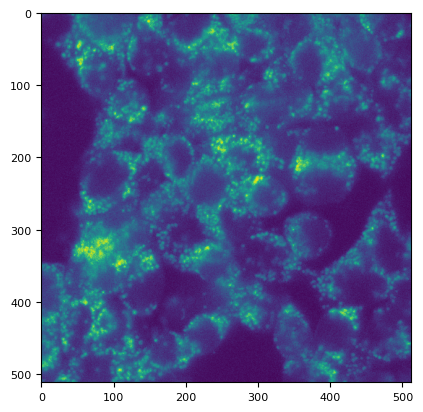

time= 390 s


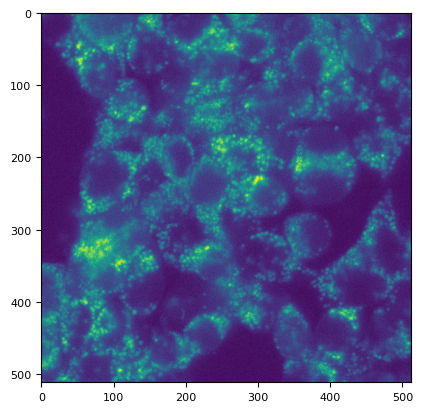

time= 420 s


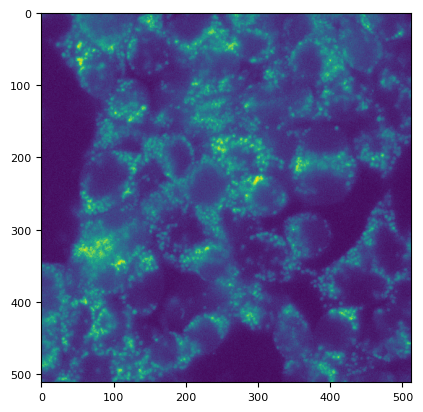

time= 450 s


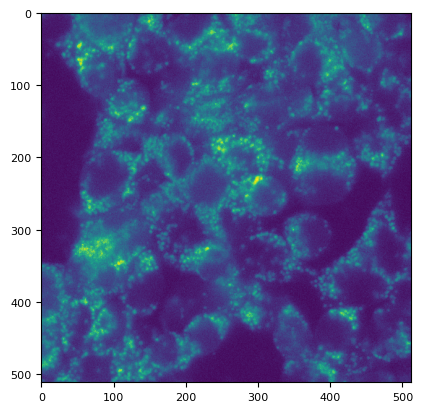

In [380]:
# Show images with time points 

# Read tiff files
img = tf.imread(tiff_files[0])

# Start tm at 0
tm=0

# Iterate through file
for i in range(img.shape[0]):

    # Print the time for each image
    print('time=',tm,'s')

    # Add 30 to the tm for each image
    tm += 30

    # Show image
    plt.imshow(img[i])
    plt.show()

(<Figure size 988.8x604.8 with 2 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x2a8c87e5bb0>)

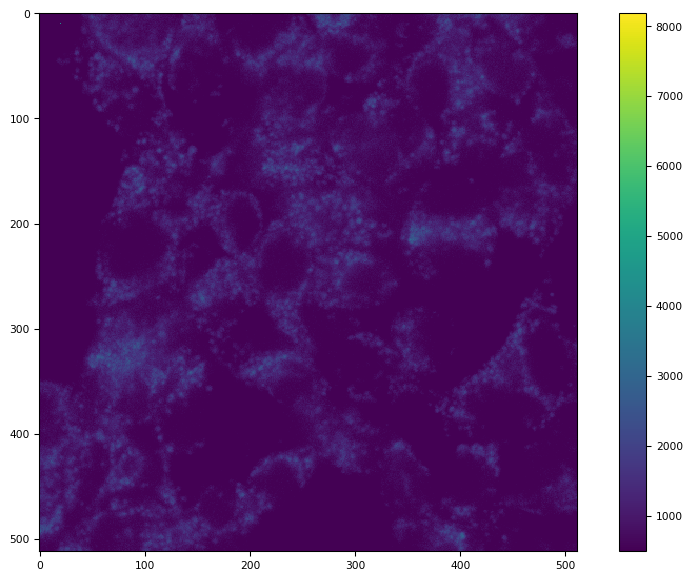

In [14]:
# Simple thresholding technique. Hard to tell if background is included in the threhshold

tf.imshow(img[0],vmin=500)

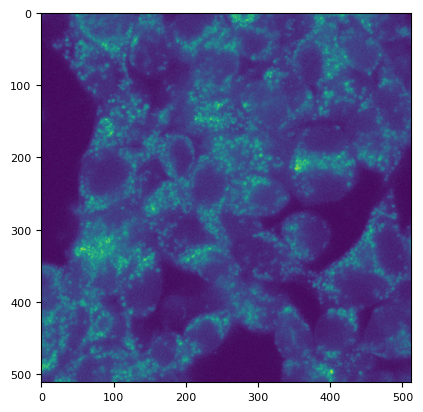

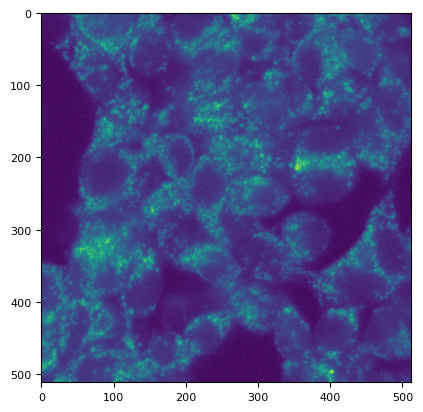

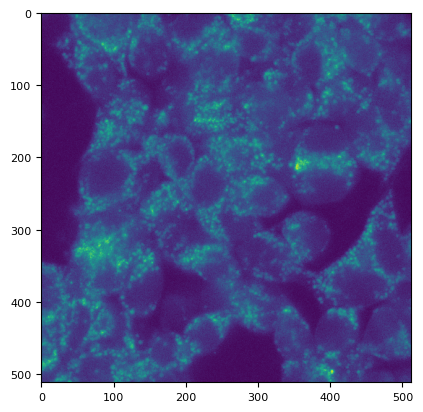

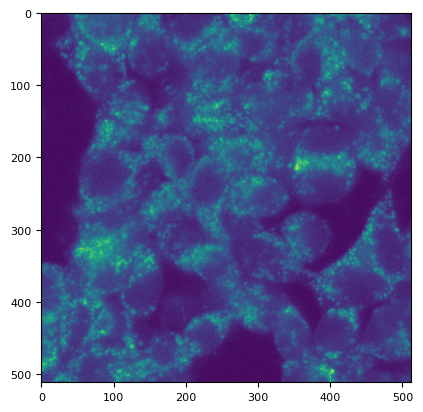

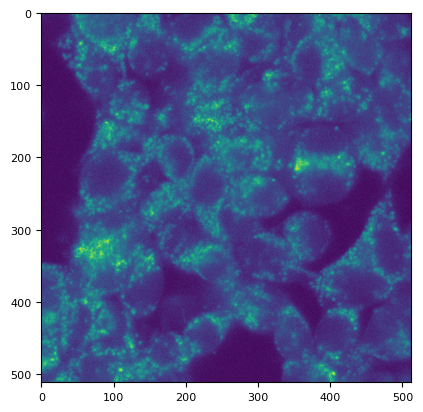

...

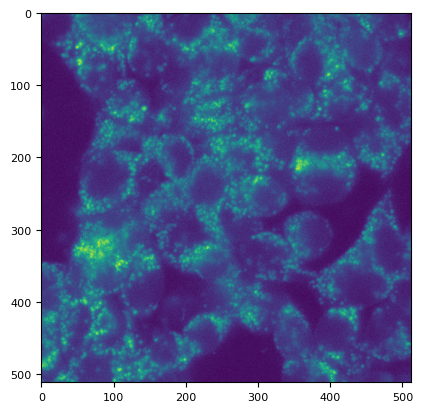

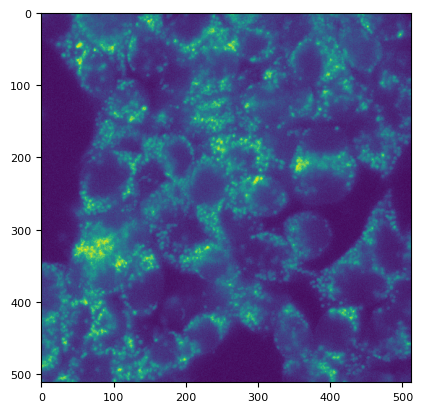

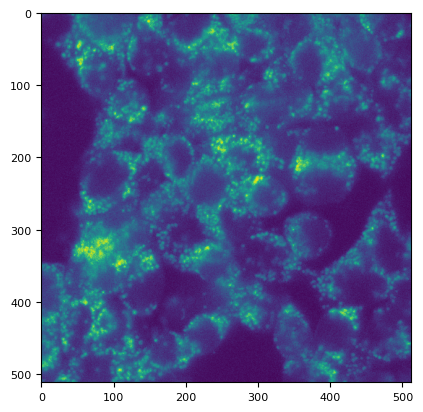

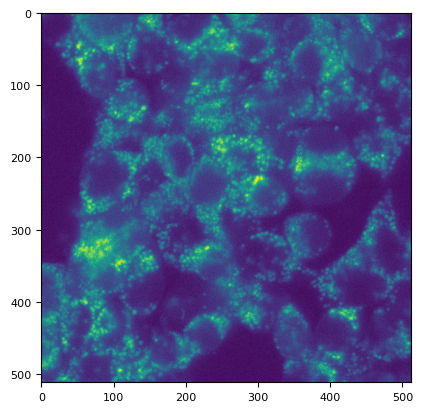

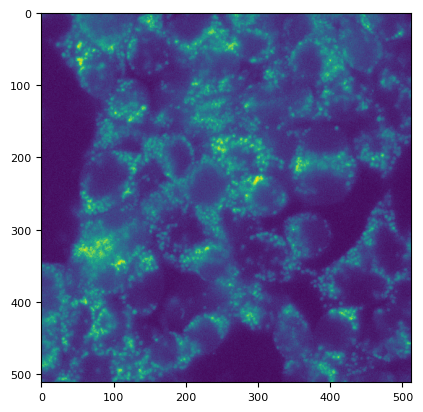

In [379]:
# Original images 

# Read file 
img = tf.imread(tiff_files[0])

# Iterate through file
for i in range(15):

    # Create a new figure for each iteration
    plt.figure() 

    # Show image for each iteration
    plt.imshow(img[i])

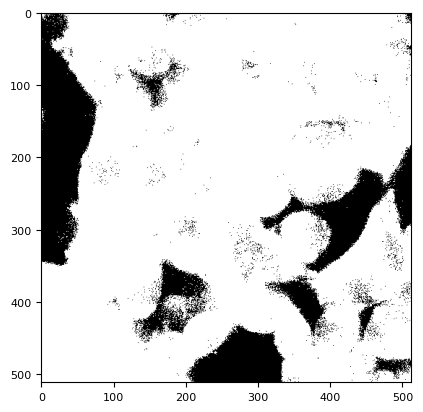

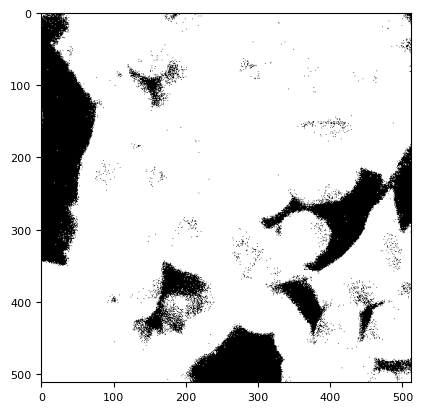

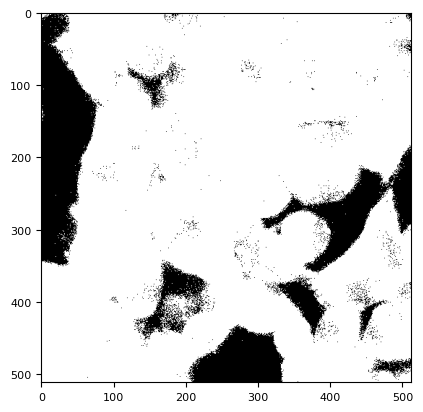

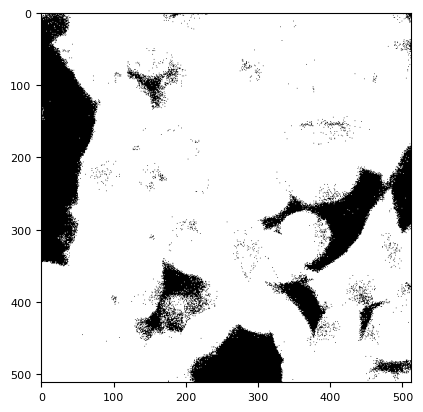

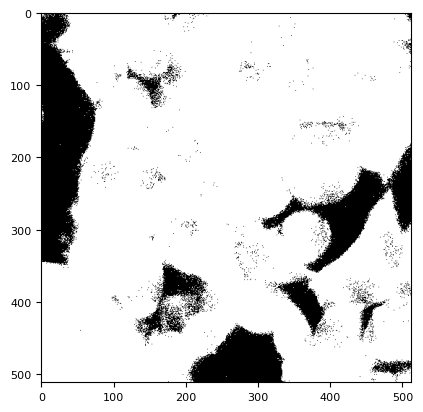

...

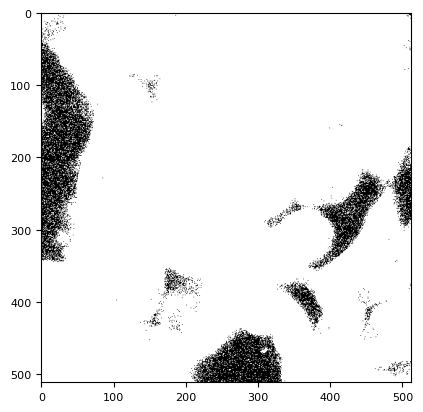

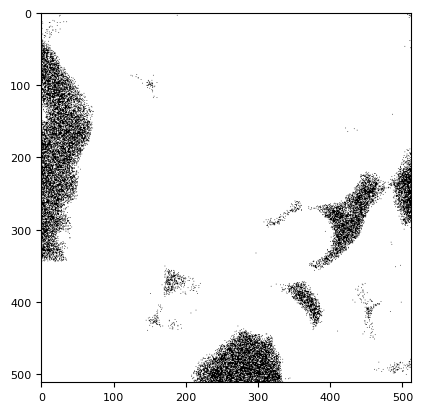

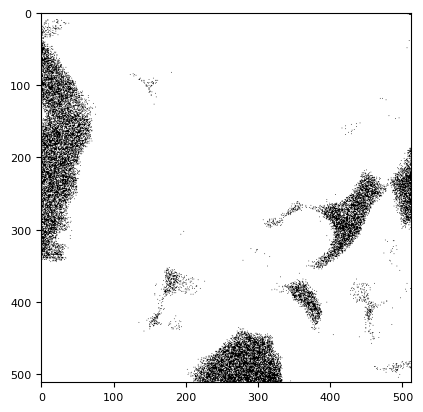

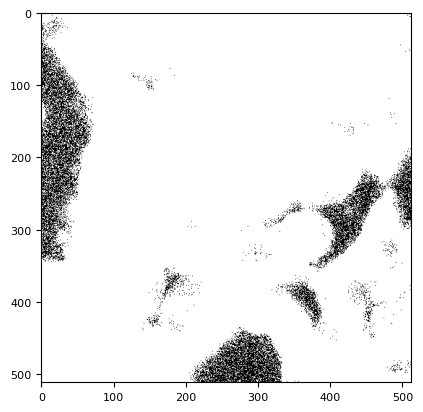

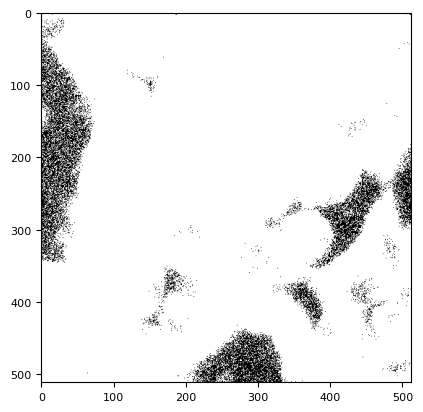

In [365]:
# Read tiff file
img = tf.imread(tiff_files[0])

# Set threshold
thrsh = 300

# Tterate through each image
for i in range(15):

    # Filter pixels above the threshold - pixels above threshold are set to 1, below to 0
    img_thrsh = np.where(img[i]<thrsh,0,1)
    
    # Create a new figure for each iteration
    plt.figure() 
    
    # Display image in grayscale
    plt.imshow(img_thrsh, cmap='gray')
    
    plt.show() 

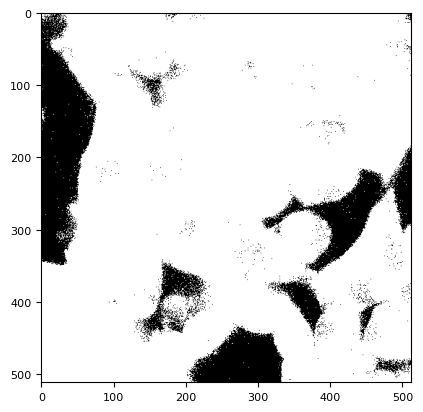

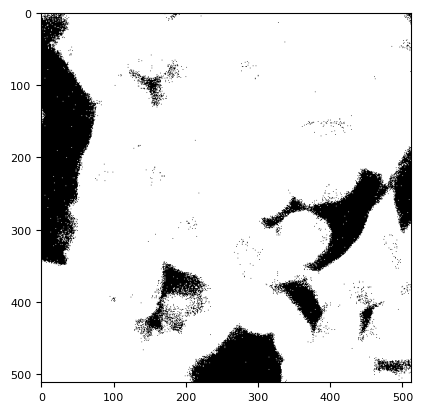

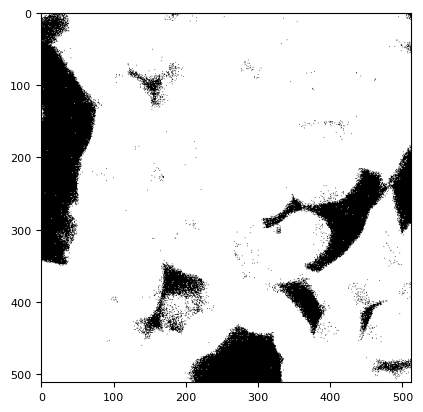

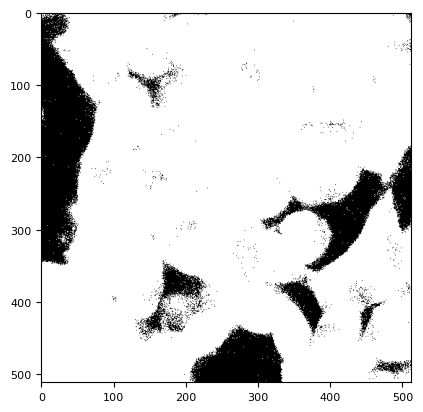

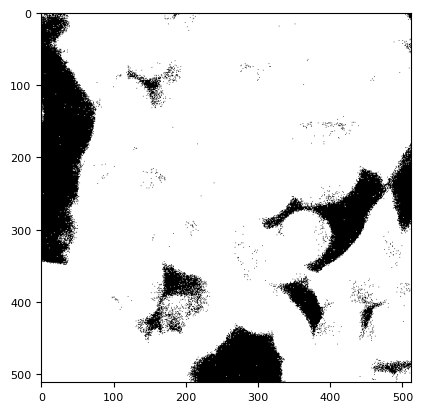

...

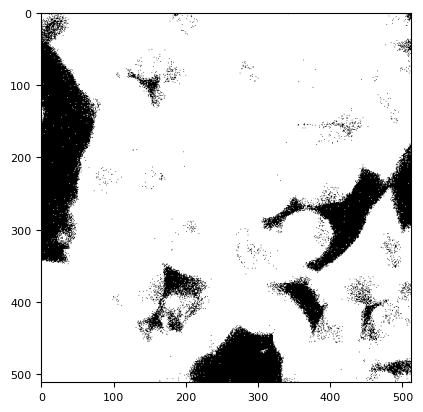

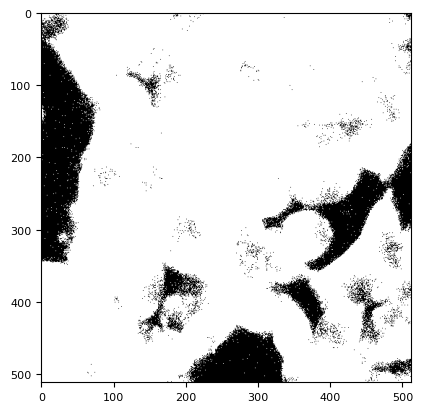

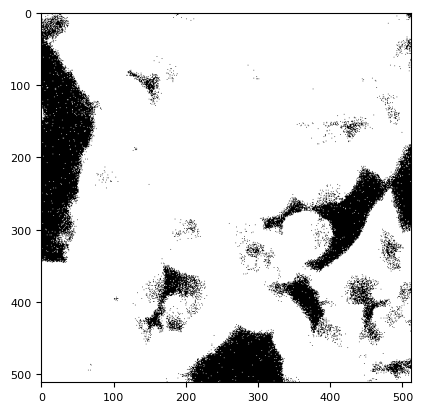

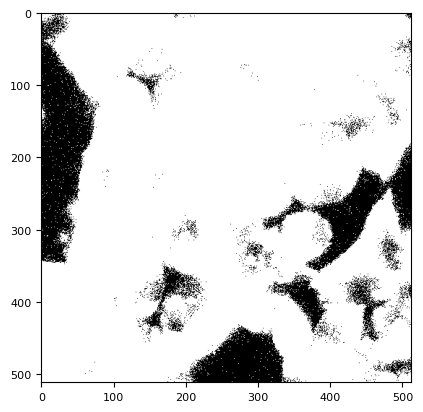

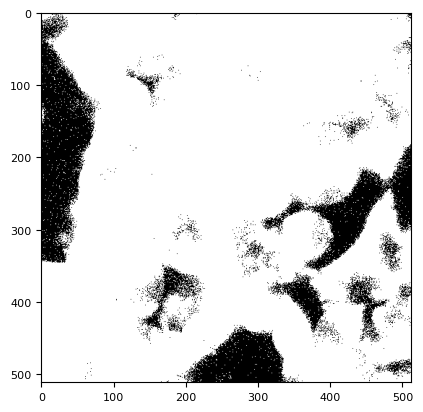

In [367]:
# Show images that has percentage threshold

# Read tiff file
img = tf.imread(tiff_files[0])

# Set threshold
percent = 15

# Iterate through file
for i in range(15):
    
    # Apply percentage threshold for each image
    thrsh = np.percentile(img[i], percent)

    # Filter pixels above the threshold - pixels above threshold are set to 1, below to 0 for each image
    img_thrsh = np.where(img[i]<thrsh,0,1)

    # Create a new figure for each image
    plt.figure()  

    # Show image using grayscale
    plt.imshow(img_thrsh, cmap='gray')
    plt.show() 

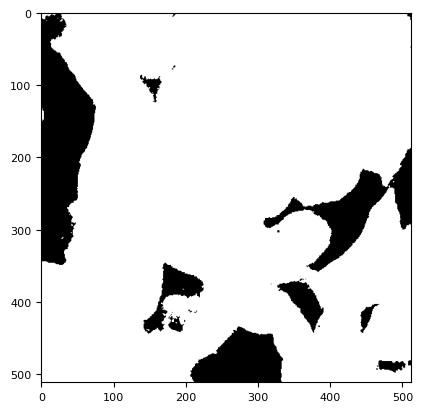

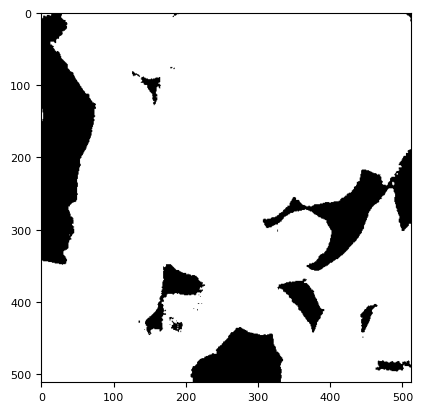

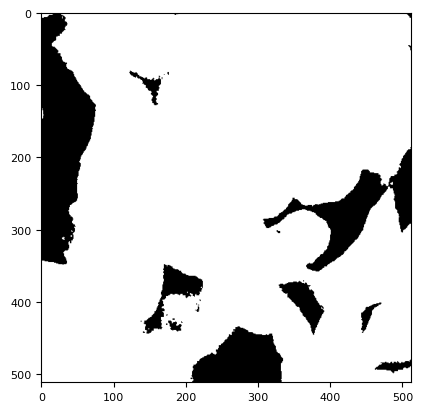

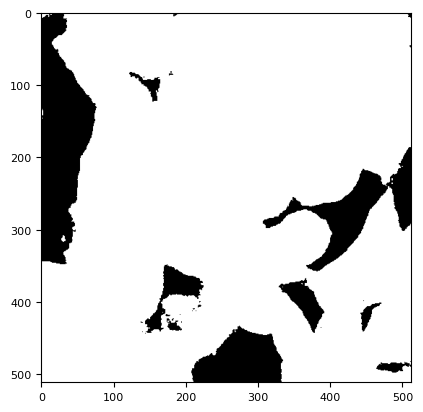

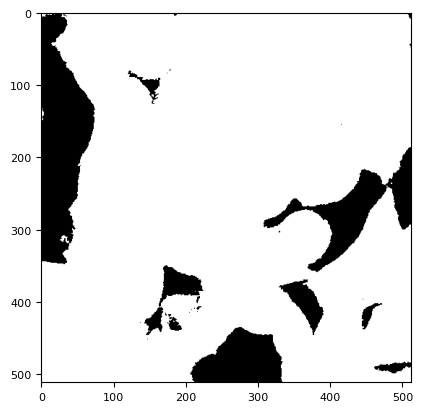

...

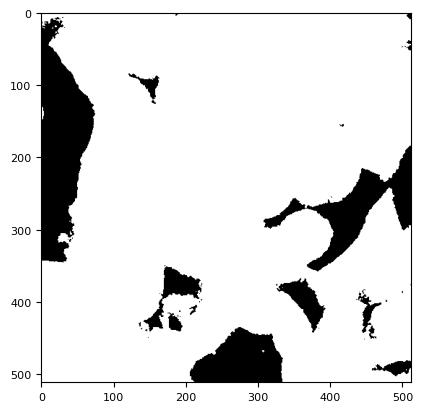

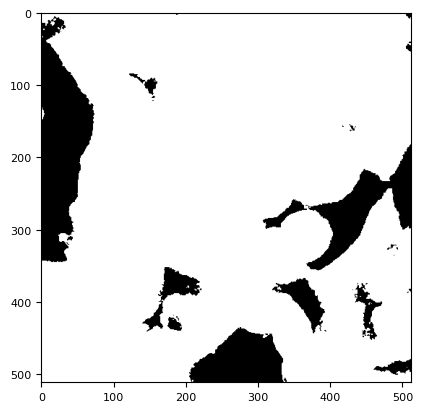

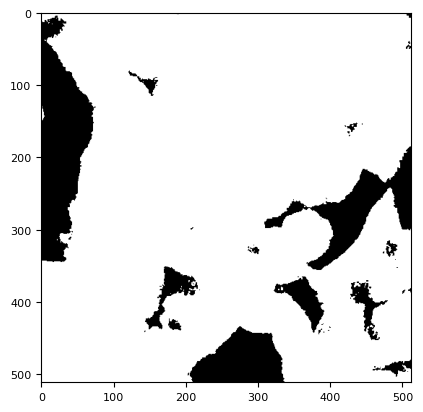

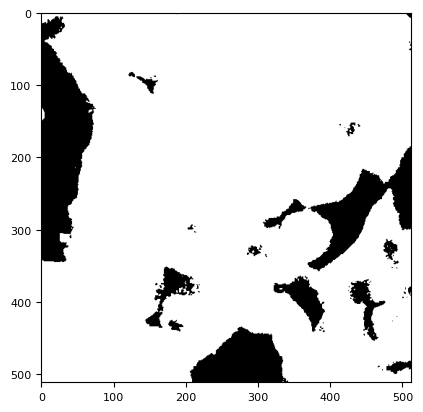

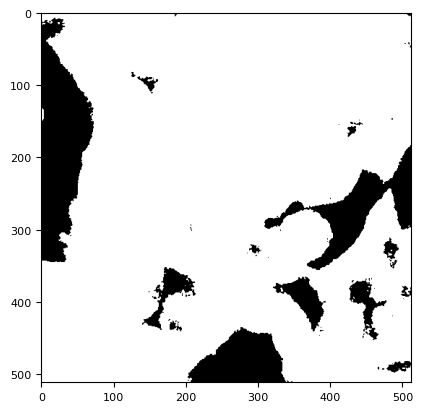

In [364]:
# Gaussian blurring and percentage threshold 

img = tf.imread(tiff_files[0])

percent = 15

for i in range(15):
    
    # Apply Gaussian filtering for each image 
    filtered_image = ndi.gaussian_filter(img[i], 1)

    thrsh = np.percentile(img[i], percent)

    img_thrsh = np.where(filtered_image<thrsh,0,1)
    plt.figure()  
    plt.imshow(img_thrsh, cmap='gray')
    plt.show() 

    
   

In [381]:
# Average galactose intensity at 250 threshold 

# Set threshold
threshold = 250

# Initialize a list to store the average mean intensities for each time point across all files
average_intensities_across_files_gal = []

# Iterate through each image
for i in range(15):
    
    # List to store mean intensities for the current image across all files
    mean_intensities_for_current_image = []
    
    # Iterate through first 3 tiff files
    for k in range(3):  
        
        # Read the current TIFF file
        img = tf.imread(tiff_files[k])
        
        # Access the current image
        this_img = img[i]
        
        # Filter pixels above the threshold 
        pxl_intensities = this_img[this_img > threshold]

        # Calculate their mean intensity
        pxl_mn = np.mean(pxl_intensities)

        # Append calculated mean intensity to list
        mean_intensities_for_current_image.append(pxl_mn)
    
    # Calculate the average of mean intensities for the current image across all files for each timpoint
    average_intensity_for_current_image = np.mean(mean_intensities_for_current_image)

    # Append avaerages of mean intensity to list
    average_intensities_across_files_gal.append(average_intensity_for_current_image)

# Print the average mean intensities
print(average_intensities_across_files_gal)


[659.6494057152034, 695.6007441996666, 703.7158639903764, 706.4417742688211, 710.9559302543281, 542.6963906693278, 526.9861555029594, 524.2455680326775, 525.7202746209009, 531.1030969157465, 878.894676796318, 930.792913285125, 930.8224184268778, 926.0669218062027, 935.0083581971521]


In [394]:
#Average glucose intensity at 300 threshold 

threshold = 300

average_intensities_across_files_glu = []

for i in range(15):
    
    mean_intensities_for_current_image = []
    
    # Iterate through last three tiff files
    for k in range(3,6):  

        img = tf.imread(tiff_files[k])

        this_img = img[i]
    
        pxl_intensities = this_img[this_img > threshold]

        pxl_mn = np.mean(pxl_intensities)

        mean_intensities_for_current_image.append(pxl_mn)
    
    average_intensity_for_current_image = np.mean(mean_intensities_for_current_image)

    average_intensities_across_files_glu.append(average_intensity_for_current_image)

print(average_intensities_across_files_glu)


[788.1068723487339, 792.2950162848725, 781.7700617810996, 776.3451388807722, 769.8057795853207, 587.3720720936616, 553.1696932605039, 546.9939129767437, 544.1686403903105, 544.1889800875086, 853.3565391045194, 907.4673682179663, 897.5230493590894, 890.9613716561315, 887.4934823296602]


In [386]:
#Number of pixels above threshold for Galactose

# Define the threshold value
threshold = 250

# Read the TIFF file
img = tf.imread(tiff_files[0])

# Initialize a list to store the counts for the file
pixels_at_time = []

# Iterate through each image in the file
for i in range(15):

    # Access the current image
    this_img = img[i]
    
    # Count pixels at or above the threshold
    pixels_above_threshold = np.sum(this_img > threshold)

    # Append pixel count to list
    pixels_at_time.append(pixels_above_threshold)

# Print the counts for each image in the TIFF file
print(pixels_at_time)


[224281, 225378, 225532, 225805, 226089, 221545, 220811, 220739, 221189, 223454, 249680, 254197, 254317, 253675, 254017]


In [286]:
#Average galactose intensity above 15% threshold

# Define percentage threshold value
percentage = 15

# Initialize a list to store the average mean intensities for each timne point across all files
average_intensities_across_galactose = []

# Iterate through each image
for i in range(15): 
    
    # List to store mean intensities for the current image across all files
    mean_intensities_for_current_image = []
    
    # Iterate through the first three TIFF files
    for k in range(3):  
        
        # Read the current TIFF file
        img = tf.imread(tiff_files[k])
        
        # Access the current image
        this_img = img[i]
        
        # Determine the threshold based on the 15th percentile of the intensity distribution
        threshold = np.percentile(this_img, percentage)
        
        # Filter pixels above the threshold and calculate their mean intensity
        pxl_intensities = this_img[this_img > threshold]

        # Calculate their mean intensity
        pxl_mn = np.mean(pxl_intensities)

        # Append calculated mean intensity to list
        mean_intensities_for_current_image.append(pxl_mn)
    
    # Calculate the average of mean intensities for the current image across all files
    average_intensity_for_current_image = np.mean(mean_intensities_for_current_image)

    # Append avaerages of mean intensity to list
    average_intensities_across_galactose.append(average_intensity_for_current_image)
    
# Print the average mean intensities 
print(average_intensities_across_galactose)


[629.64519102039, 667.4152187606671, 676.9019659660489, 680.479397391171, 685.5671532783754, 514.892830330342, 499.4051396300095, 498.0993744604966, 500.55445109311313, 506.8977668179318, 900.6038660534347, 965.8993244791278, 981.7533681480012, 992.0048589293128, 1017.085664517319]


In [321]:
#Average glucose intensity above 25% threshold

percentage = 25

average_intensities_across_glucose = []

for i in range(15):  

    mean_intensities_for_current_image = []
    
    # Iterate through the lase three TIFF files
    for k in range(3,6):  
        
        img = tf.imread(tiff_files[k])

        this_img = img[i]
        
        # Determine the threshold based on the 25th percentile of the intensity distribution
        threshold = np.percentile(this_img, percentage)
        
        pxl_intensities = this_img[this_img > threshold]
        pxl_mn = np.mean(pxl_intensities)

        mean_intensities_for_current_image.append(pxl_mn)
    
    average_intensity_for_current_image = np.mean(mean_intensities_for_current_image)

    average_intensities_across_glucose.append(average_intensity_for_current_image)

print(average_intensities_across_glucose)


[721.0378347436623, 722.1537058417306, 711.6911027864566, 706.4067628552011, 699.4141218405235, 533.4637593739634, 498.7803402575302, 493.4821274709373, 490.9250169314624, 491.3644417650741, 882.9378626351642, 964.744493659504, 987.2015598348071, 991.4907293980751, 998.1553403472208]


In [383]:
#Number of pixels above 25% threshold 

percent = 25

img = tf.imread(tiff_files[3])

pixels_count = []

for i in range(15):
    
    this_img = img[i]

    threshold = np.percentile(this_img, percent)

    count_above_threshold = np.sum(this_img > threshold)
        
    pixels_count.append(count_above_threshold)

# print number of pixels above threshold
print(pixels_count)


[196535, 196551, 196564, 196505, 196519, 196455, 196359, 196565, 196374, 196362, 196347, 196536, 196379, 196292, 196431]


In [387]:
#Number of pixels above 15% threshold when Gaussion blur is used

percent = 15

img = tf.imread(tiff_files[0])

pixels_count_guassian = []

for i in range(15):
    
    # Apply Gaussion filter
    this_img = ndi.gaussian_filter(img[i], 1)

    threshold = np.percentile(this_img, percent)
        
    count_above_threshold = np.sum(this_img > threshold)
        
    pixels_count_guassian.append(count_above_threshold)

print(pixels_count_guassian)


[222744, 222719, 222724, 222777, 222789, 222752, 222658, 222782, 222767, 222801, 222734, 222780, 222773, 222714, 222646]


In [389]:
# Mean intensities for each Galactose files for set threshold

threshold = 250

# Iterate over first three files
for k in range(3): 
    
    # Read the current TIFF file
    img = tf.imread(tiff_files[k])
    
    # Initialize a list to store mean intensities for the current file
    int_at_time = []
    
    # Iterate through each image in the file
    for i in range(15):
        this_img = img[i]
        # Filter pixels above the threshold and calculate their mean intensity
        pxl_intensities = this_img[this_img > threshold]
        pxl_mn = np.mean(pxl_intensities)  
        int_at_time.append(pxl_mn)
    
    # Print mean intensities for the current file
    print(f"Mean intensities for file {k}: {int_at_time}")


Mean intensities for file 0: [745.9098452387852, 767.4494759914455, 761.2327563272618, 749.5901153650274, 750.5694660067495, 570.0344219007425, 545.0469813550956, 534.7573061398303, 531.9543331720836, 544.1937579994093, 958.6855254726049, 1030.6995401204579, 1030.9565778143026, 1017.0672119838376, 1002.3250294271643]
Mean intensities for file 1: [504.57979837515336, 507.8393185689949, 501.5527308195849, 499.73751221235995, 498.6358410267841, 409.9019333589009, 397.75753466376295, 395.103525063419, 396.10655257029964, 394.940666247643, 642.2054200265387, 662.0431854166492, 655.5837333122416, 652.3697318801542, 651.9777645226497]
Mean intensities for file 2: [728.4585735316715, 811.513438038559, 848.3621048242828, 869.9976952290758, 883.6624837294509, 648.1528167483402, 638.1539504900196, 642.8758728947831, 649.0999381203194, 654.1748665001874, 1035.7930848898104, 1099.6360143182678, 1105.9269441540891, 1108.7638215546165, 1150.722280641642]


In [388]:
# Mean intensities for each Glucose files for set threshold

threshold = 300

# Iterate over last three files
for k in range(3,6): 
    
    # Read the current TIFF file
    img = tf.imread(tiff_files[k])
    
    # Initialize a list to store mean intensities for the current file
    int_at_time = []
    
    # Iterate through each image in the file
    for i in range(15):
        this_img = img[i]
        # Filter pixels above the threshold and calculate their mean intensity
        pxl_intensities = this_img[this_img > threshold]
        pxl_mn = np.mean(pxl_intensities)  
        int_at_time.append(pxl_mn)
    
    # Print mean intensities for the current file
    print(f"Mean intensities for file {k}: {int_at_time}")


Mean intensities for file 3: [751.3496187057543, 756.3293316591099, 742.7476002882283, 733.6473061400828, 728.4105542700884, 577.8927823062829, 545.6182521785128, 534.0828739146932, 530.9539992866378, 530.7417614376008, 829.4139300919272, 900.0699256871699, 896.2144254740998, 889.6748976969197, 890.4148461581816]
Mean intensities for file 4: [751.1408850185026, 745.2179153717215, 736.724920724827, 736.0059073460635, 729.3257014269641, 596.256435414449, 549.2055569100354, 541.1474070725945, 533.0252117667329, 530.6257529876044, 876.0321637310723, 899.516783177985, 884.7139750468269, 866.3038354676971, 850.7004132645494]
Mean intensities for file 5: [861.830113321945, 875.3378018237863, 865.8376643302432, 859.3822031561705, 851.6810830589096, 587.9669985602526, 564.6852706929635, 565.7514579429433, 568.526710117561, 571.1994258373205, 854.6235234905585, 922.8153957887439, 911.6407475563416, 916.9053818037776, 921.3651875662492]


In [311]:
# Mean intensities for each Galactose files for percentage threshold

percentage = 15

# Iterate through first three files
for k in range(3):  
    
    img = tf.imread(tiff_files[k])

    mean_intensities_at_time = []

    for i in range(15):
        # Access the current image
        this_img = img[i]
            
        # Determine the threshold based on the 15th percentile of the intensity distribution
        threshold = np.percentile(this_img, percentage)
            
        # Filter pixels above the threshold and calculate their mean intensity
        pxl_intensities = this_img[this_img > threshold]
            
        pxl_mn = np.mean(pxl_intensities)
            
        mean_intensities_at_time.append(pxl_mn)
    
    print(f"Mean intensities for file {k}: {mean_intensities_at_time}")


Mean intensities for file 0: [749.3317020388188, 773.4085077347124, 767.5688294194243, 756.1613990520987, 757.7525761628638, 568.1943908372006, 542.343933722882, 532.3187553623006, 530.0767192440356, 545.2259392992195, 1035.6971793053299, 1129.360159809665, 1130.5251017760881, 1113.2798039330105, 1097.7528469663032]
Mean intensities for file 1: [460.01052622124826, 465.3951512863384, 461.0811205266727, 460.85407628852073, 460.57652627746086, 368.05009873440446, 355.92772497999476, 354.1492573545278, 356.3098370532904, 354.83439811172303, 663.1447520805839, 691.0105489880435, 686.372474384325, 684.8376791526551, 684.5834000161838]
Mean intensities for file 2: [679.5933448011031, 763.4419972609505, 802.0559479520498, 824.4227168328936, 838.3723573948013, 608.434001419421, 599.9437601871517, 607.8301106646613, 615.2767969820134, 620.632963042853, 1002.9696667743905, 1077.3272646396751, 1128.36252828359, 1177.897093702273, 1268.92074656947]


In [335]:
# Mean intensities for each Glucose files for percentage threshold

percentage = 25

# Iterate through last three files
for k in range(3,6):  
    
    img = tf.imread(tiff_files[k])

    mean_intensities_at_time = []

    for i in range(15):
        # Access the current image
        this_img = img[i]
            
        # Determine the threshold based on the 15th percentile of the intensity distribution
        threshold = np.percentile(this_img, percentage)
            
        # Filter pixels above the threshold and calculate their mean intensity
        pxl_intensities = this_img[this_img > threshold]
            
        pxl_mn = np.mean(pxl_intensities)
            
        mean_intensities_at_time.append(pxl_mn)
    
    print(f"Mean intensities for file {k}: {mean_intensities_at_time}")


Mean intensities for file 3: [736.4487444984354, 741.3706824183037, 727.6887425978307, 718.2790361568408, 714.0106809010833, 555.851019317401, 522.0713336287107, 510.7093175285529, 508.4556967826698, 509.8252513215388, 891.8692671647644, 976.6364635486628, 984.1286746546219, 978.517856051189, 985.8867541274035]
Mean intensities for file 4: [807.7228801058039, 799.927498104509, 789.5253727392582, 788.8803162916686, 780.8319410294395, 622.4464654689806, 568.3600468121915, 560.9028981450854, 552.3889069914262, 550.7078300824728, 1006.7030086280574, 1041.6933051624071, 1024.7554869632097, 999.0870379893787, 977.6585830105809]
Mean intensities for file 5: [618.941879626748, 625.162937002379, 617.8591930222808, 612.0609361170939, 603.399743591048, 422.0937933355086, 405.9096403316885, 408.83416673917384, 411.9304470202912, 413.56024389121063, 750.2413121126704, 875.9037122674422, 952.7205178865897, 996.8672941536578, 1030.920683903678]


In [300]:
#Calculate standard deviation for error for galactose

Average_intensity_GalactoseA = [745.9098452387852, 767.4494759914455, 761.2327563272618, 749.5901153650274, 750.5694660067495, 570.0344219007425, 545.0469813550956, 534.7573061398303, 531.9543331720836, 544.1937579994093, 958.6855254726049, 1030.6995401204579, 1030.9565778143026, 1017.0672119838376, 1002.3250294271643]
Average_intensity_GalactoseB = [504.57979837515336, 507.8393185689949, 501.5527308195849, 499.73751221235995, 498.6358410267841, 409.9019333589009, 397.75753466376295, 395.103525063419, 396.10655257029964, 394.940666247643, 642.2054200265387, 662.0431854166492, 655.5837333122416, 652.3697318801542, 651.9777645226497]
Average_intensity_GalactoseC = [728.4585735316715, 811.513438038559, 848.3621048242828, 869.9976952290758, 883.6624837294509, 648.1528167483402, 638.1539504900196, 642.8758728947831, 649.0999381203194, 654.1748665001874, 1035.7930848898104, 1099.6360143182678, 1105.9269441540891, 1108.7638215546165, 1150.722280641642]

std_devs = []

#Use standard deviation function
for i in range (15):
    mean_intensities = [Average_intensity_GalactoseA[i], Average_intensity_GalactoseB[i], Average_intensity_GalactoseC[i]]
    std_dev = np.std(mean_intensities)
    std_devs.append(std_dev)
    
print(std_devs)


[109.8819792974773, 133.98052819712032, 147.3099456982957, 154.2065396071319, 159.66277599747127, 99.16786046117093, 98.96886466080639, 101.4253635799634, 103.37814371690604, 106.23595342710665, 170.29924081352087, 192.10738583882568, 197.01504053414436, 197.12040462917682, 209.10152838403508]


In [392]:
#Calculate standard deviation for error for glucose

Average_intensity_GlucoseA = [751.3496187057543, 756.3293316591099, 742.7476002882283, 733.6473061400828, 728.4105542700884, 577.8927823062829, 545.6182521785128, 534.0828739146932, 530.9539992866378, 530.7417614376008, 829.4139300919272, 900.0699256871699, 896.2144254740998, 889.6748976969197, 890.4148461581816]
Average_intensity_GlucoseB = [751.1408850185026, 745.2179153717215, 736.724920724827, 736.0059073460635, 729.3257014269641, 596.256435414449, 549.2055569100354, 541.1474070725945, 533.0252117667329, 530.6257529876044, 876.0321637310723, 899.516783177985, 884.7139750468269, 866.3038354676971, 850.7004132645494]
Average_intensity_GlucoseC = [861.830113321945, 875.3378018237863, 865.8376643302432, 859.3822031561705, 851.6810830589096, 587.9669985602526, 564.6852706929635, 565.7514579429433, 568.526710117561, 571.1994258373205, 854.6235234905585, 922.8153957887439, 911.6407475563416, 916.9053818037776, 921.3651875662492]

std_devs = []

#Use standard deviation function
for i in range (15):
    mean_intensities = [Average_intensity_GlucoseA[i], Average_intensity_GlucoseB[i], Average_intensity_GlucoseC[i]]
    std_dev = np.std(mean_intensities)
    std_devs.append(std_dev)
    
print(std_devs)

[52.13027327208668, 58.89507090594496, 59.495599366964086, 58.723966047487366, 57.89578777279568, 7.508723459849992, 8.273394366338046, 13.573528822774165, 17.244499623795445, 19.099328071824388, 19.052888914533476, 10.855043509628144, 11.031685933378828, 20.678013836543418, 28.92263654119946]


In [337]:
#Calculate standard deviation for error for galactose. Percentage threshold

Average_intensity_GalactoseA_per = [749.3317020388188, 773.4085077347124, 767.5688294194243, 756.1613990520987, 757.7525761628638, 568.1943908372006, 542.343933722882, 532.3187553623006, 530.0767192440356, 545.2259392992195, 1035.6971793053299, 1129.360159809665, 1130.5251017760881, 1113.2798039330105, 1097.7528469663032]
Average_intensity_GalactoseB_per = [460.01052622124826, 465.3951512863384, 461.0811205266727, 460.85407628852073, 460.57652627746086, 368.05009873440446, 355.92772497999476, 354.1492573545278, 356.3098370532904, 354.83439811172303, 663.1447520805839, 691.0105489880435, 686.372474384325, 684.8376791526551, 684.5834000161838]
Average_intensity_GalactoseC_per = [679.5933448011031, 763.4419972609505, 802.0559479520498, 824.4227168328936, 838.3723573948013, 608.434001419421, 599.9437601871517, 607.8301106646613, 615.2767969820134, 620.632963042853, 1002.9696667743905, 1077.3272646396751, 1128.36252828359, 1177.897093702273, 1268.92074656947]
    
std_devs = []

#Use standard deviation function
for i in range (15):
    mean_intensities = [Average_intensity_GalactoseA_per[i], Average_intensity_GalactoseB_per[i], Average_intensity_GalactoseC_per[i]]
    std_dev = np.std(mean_intensities)
    std_devs.append(std_dev)
    
print(std_devs)

[123.28232975219038, 142.90769417006013, 153.2564698597228, 157.77909267574998, 162.46122400985377, 105.12499681131854, 104.14336716971046, 106.3538695613734, 107.764078187067, 111.84514855870603, 168.43969371003226, 195.53300610243724, 208.8676989252586, 218.79610871500188, 245.27933652256854]


In [391]:
#Calculate standard deviation for error for glucose. Percentage threshold

Average_intensity_GlucoseA_per = [736.4487444984354, 741.3706824183037, 727.6887425978307, 718.2790361568408, 714.0106809010833, 555.851019317401, 522.0713336287107, 510.7093175285529, 508.4556967826698, 509.8252513215388, 891.8692671647644, 976.6364635486628, 984.1286746546219, 978.517856051189, 985.8867541274035]
Average_intensity_GlucoseB_per = [807.7228801058039, 799.927498104509, 789.5253727392582, 788.8803162916686, 780.8319410294395, 622.4464654689806, 568.3600468121915, 560.9028981450854, 552.3889069914262, 550.7078300824728, 1006.7030086280574, 1041.6933051624071, 1024.7554869632097, 999.0870379893787, 977.6585830105809]
Average_intensity_GlucoseC_per = [618.941879626748, 625.162937002379, 617.8591930222808, 612.0609361170939, 603.399743591048, 422.0937933355086, 405.9096403316885, 408.83416673917384, 411.9304470202912, 413.56024389121063, 750.2413121126704, 875.9037122674422, 952.7205178865897, 996.8672941536578, 1030.920683903678]
std_devs = []

#Use standard deviation function
for i in range (15):
    mean_intensities = [Average_intensity_GlucoseA_per[i], Average_intensity_GlucoseB_per[i], Average_intensity_GlucoseC_per[i]]
    std_dev = np.std(mean_intensities)
    std_devs.append(std_dev)
    
print(std_devs)

[77.83610404806005, 72.62980148609091, 70.98949534640666, 72.67272049557438, 73.16802955872821, 83.31142524122733, 68.33440529524614, 63.26561375561357, 58.66650547174758, 57.4918325598368, 104.89034888886314, 68.20367286763495, 29.488315877822412, 9.217859398284647, 23.410845118754054]


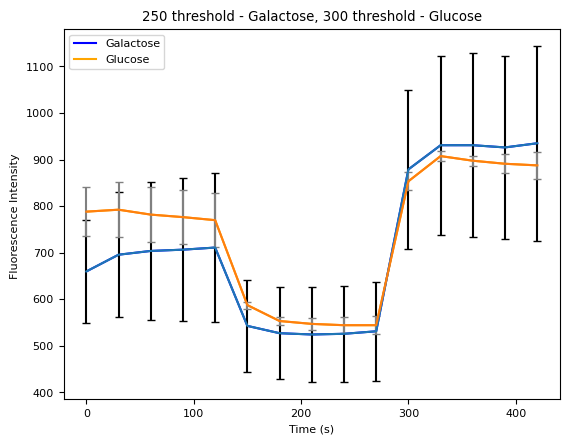

In [393]:
# Graph for set thresholds

sample_means = [[659.6494057152034,695.6007441996666,703.7158639903764,706.4417742688211,
710.9559302543281,542.6963906693278,526.9861555029594,524.2455680326775,
525.7202746209009,531.1030969157465,878.894676796318,930.792913285125,
930.8224184268778,926.0669218062027,935.0083581971521],
[788.1068723487339,792.2950162848725,781.7700617810996,776.3451388807722,
769.8057795853207,587.3720720936616,553.1696932605039,546.9939129767437,
544.1686403903105,544.1889800875086,853.3565391045194,907.4673682179663,
897.5230493590894,890.9613716561315,887.4934823296602]]
# Set time points
time_points = [0,30,60,90,120,150,180,210,240,270,300,330,360,390,420]
# Errors taken from calculated standard deviation
errs1 = [109.8819792974773, 133.98052819712032, 147.3099456982957, 154.2065396071319, 159.66277599747127, 99.16786046117093, 98.96886466080639, 101.4253635799634, 103.37814371690604, 106.23595342710665, 170.29924081352087, 192.10738583882568, 197.01504053414436, 197.12040462917682, 209.10152838403508]
errs2 = [52.13027327208668, 58.89507090594496, 59.495599366964086, 58.723966047487366, 57.89578777279568, 7.508723459849992, 8.273394366338046, 13.573528822774165, 17.244499623795445, 19.099328071824388, 19.052888914533476, 10.855043509628144, 11.031685933378828, 20.678013836543418, 28.92263654119946]
# Set two lines
plt.plot(time_points,sample_means[0], color = 'blue')
plt.plot(time_points,sample_means[1], color = 'orange')
# Set error bars
plt.errorbar(time_points, sample_means[0],yerr=errs1,ecolor='black',capsize=3)
plt.errorbar(time_points, sample_means[1],yerr=errs2,ecolor='grey',capsize=3)
# Label graph
plt.xlabel('Time (s)')
plt.ylabel('Fluorescence Intensity ')
plt.title('250 threshold - Galactose, 300 threshold - Glucose')
plt.legend(['Galactose','Glucose'])

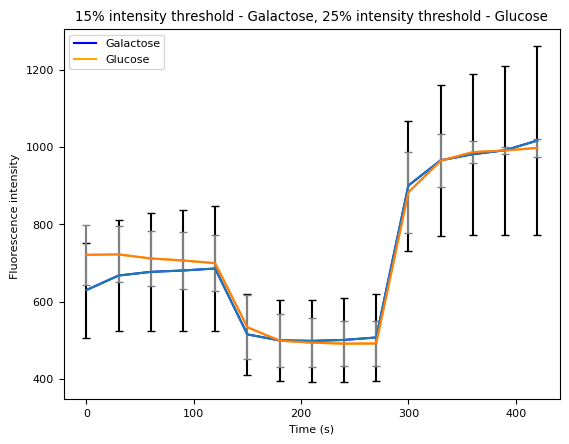

In [350]:
#Graph for percentage thresholds

sample_means = [average_intensities_across_galactose,
average_intensities_across_glucose]
time_points = [0,30,60,90,120,150,180,210,240,270,300,330,360,390,420]
#errors taken from calculated standard deviation
errs1 = [123.28232975219038, 142.90769417006013, 153.2564698597228, 157.77909267574998, 162.46122400985377, 105.12499681131854, 104.14336716971046, 106.3538695613734, 107.764078187067, 111.84514855870603, 168.43969371003226, 195.53300610243724, 208.8676989252586, 218.79610871500188, 245.27933652256854]
errs2 = [77.83610404806005, 72.62980148609091, 70.98949534640666, 72.67272049557438, 73.16802955872821, 83.31142524122733, 68.33440529524614, 63.26561375561357, 58.66650547174758, 57.4918325598368, 104.89034888886314, 68.20367286763495, 29.488315877822412, 9.217859398284647, 23.410845118754054]
plt.plot(time_points,sample_means[0],color = 'blue')
plt.plot(time_points,sample_means[1],color = 'orange')
plt.errorbar(time_points, sample_means[0],yerr=errs1,ecolor='black',capsize=3)
plt.errorbar(time_points, sample_means[1],yerr=errs2,ecolor='grey',capsize=3)
plt.xlabel('Time (s)')
plt.ylabel('Fluorescence intensity ')
plt.title('15% intensity threshold - Galactose, 25% intensity threshold - Glucose')
plt.legend(['Galactose','Glucose'])

In [328]:
#250 threshold and 300 threshold

fccp_galactose = 542.6963906693278,526.9861555029594,524.2455680326775,525.7202746209009,531.1030969157465
fccp_galactose_average = np.mean(fccp_galactose)

rotenone_galactose = 878.894676796318,930.792913285125,930.8224184268778,926.0669218062027,935.0083581971521
rotenone_galactose_average = np.mean(rotenone_galactose)

fccp_glucose = 587.3720720936616,553.1696932605039,546.9939129767437,544.1686403903105,544.1889800875086
fccp_glucose_average = np.mean(fccp_glucose)

rotenone_glucose = 853.3565391045194,907.4673682179663,897.5230493590894,890.9613716561315,887.49348232966028
rotenone_glucose_average = np.mean(rotenone_glucose)

print(f"FCCP galactose average:{fccp_galactose_average}") 
print(f"Rotenone galactose average:{rotenone_galactose_average}")
print(f"FCCP glucose average:{fccp_glucose_average}")
print(f"Rotenone glucose average:{rotenone_glucose_average}")

FCCP galactose average:530.1502971483224
Rotenone galactose average:920.3170577023351
FCCP glucose average:555.1786597617456
Rotenone glucose average:880.4119536612428


In [330]:
#Percentage thresholds

fccp_galactose = 514.892830330342, 499.4051396300095, 498.0993744604966, 500.55445109311313, 506.8977668179318,
fccp_galactose_average = np.mean(fccp_galactose)

rotenone_galactose = 900.6038660534347, 965.8993244791278, 981.7533681480012, 992.0048589293128, 1017.085664517319
rotenone_galactose_average = np.mean(rotenone_galactose)

fccp_glucose = 533.4637593739634, 498.7803402575302, 493.4821274709373, 490.9250169314624, 491.3644417650741  
fccp_glucose_average = np.mean(fccp_glucose)

rotenone_glucose = 882.9378626351642, 964.744493659504, 987.2015598348071, 991.4907293980751, 998.1553403472208 
rotenone_glucose_average = np.mean(rotenone_glucose)

print(f"FCCP galactose average:{fccp_galactose_average}") 
print(f"Rotenone galactose average:{rotenone_galactose_average}")
print(f"FCCP glucose average:{fccp_glucose_average}")
print(f"Rotenone glucose average:{rotenone_glucose_average}")

FCCP galactose average:503.9699124663786
Rotenone galactose average:971.469416425439
FCCP glucose average:501.60313715979345
Rotenone glucose average:964.9059971749542


In [172]:
pip install scipy

Note: you may need to restart the kernel to use updated packages.


In [164]:
from scipy.stats import wilcoxon

In [352]:
galactose_redox = [33.19070758,42.40505952,44.48497012,45.18362273,46.34060391]

glucose_redox = [71.61880932,72.90654462,69.67042006,68.00241035,65.99174311]

# redox average 
galactose_redox_average = np.mean(galactose_redox)
print(galactose_redox_average)

glucose_redox_average = np.mean(glucose_redox)
print(glucose_redox_average)

#Use Wilcoxin signed test function - one tailed test
stat, p = wilcoxon(galactose_redox, glucose_redox,alternative = 'less')
print(f"Test Statistic: {stat}, p-Value: {p}")

42.320992772
69.63798549200001
Test Statistic: 0.0, p-Value: 0.03125


In [351]:
galactose_redox_percentage = [26.88244105,34.96159994,36.99085283,37.75607962,38.8443708]

glucose_redox_percentage = [47.36312173,47.60397306,45.34570877,44.20512873,42.69582637]

# redox average 
galactose_redox_average = np.mean(galactose_redox_percentage)
print(galactose_redox_average)

glucose_redox_average = np.mean(glucose_redox_percentage)
print(glucose_redox_average)

#Use Wilcoxin signed test function - one tailed test
stat, p = wilcoxon(galactose_redox_percentage, glucose_redox_percentage,alternative = 'less')
print(f"Test Statistic: {stat}, p-Value: {p}")


35.087068848
45.442751732000005
Test Statistic: 0.0, p-Value: 0.03125
